In [ ]:
import cv2

In [ ]:
from google.colab import drive
drive.mount('/g')

Drive already mounted at /g; to attempt to forcibly remount, call drive.mount("/g", force_remount=True).


In [ ]:
image = cv2.imread('/g/My Drive/Tensorflow AI/twice1.png')

In [ ]:
image.shape

(2048, 1365, 3)

In [ ]:
type(image)

numpy.ndarray

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(image)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# install pnslib
!pip install git+git://github.com/PnS2019/pnslib.git

  Cloning git://github.com/PnS2019/pnslib.git to /tmp/pip-req-build-hggj13i0
  Running command git clone -q git://github.com/PnS2019/pnslib.git /tmp/pip-req-build-hggj13i0
  Created wheel for pnslib: filename=pnslib-0.1.0a1-cp37-none-any.whl size=1489618 sha256=828aa2219150d6ee48053d50d66e54d06587472b8941855c7e48ca06c769222b
  Stored in directory: /tmp/pip-ephem-wheel-cache-hxgblxk4/wheels/a2/8e/a9/c62e72840009deaa723b3a113d5c3b90acac77098d16e90eca
Successfully built pnslib


haarcascade 파일 참고

https://github.com/opencv/opencv/tree/master/data/haarcascades



In [ ]:
from pnslib import utils
import matplotlib.pyplot as plt

In [ ]:
# load face cascade and eye cascade
face_cascade = cv2.CascadeClassifier(
    utils.get_haarcascade_path('haarcascade_frontalface_default.xml'))
eye_cascade = cv2.CascadeClassifier(
    utils.get_haarcascade_path('haarcascade_eye.xml'))

In [ ]:
faces = face_cascade.detectMultiScale(image)

In [ ]:
faces

array([[ 389,  419,  576,  576],
       [ 768, 1509,   61,   61],
       [ 524, 1514,  212,  212],
       [ 740, 1568,   67,   67]], dtype=int32)

결과 값은 x,y,w,h로 나옵니다

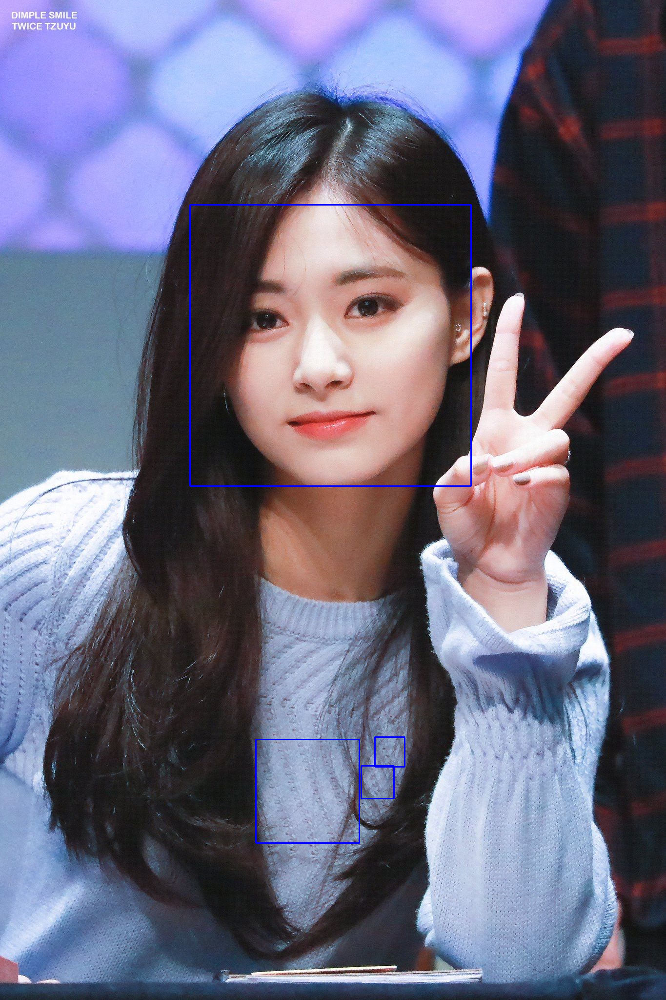

In [ ]:
# Face를 그려봅시다
image_temp = image.copy()
for (x, y, w, h) in faces:
    cv2.rectangle(image_temp, (x, y), (x+w, y+h), (255, 0, 0), 2)    
cv2_imshow(image_temp)

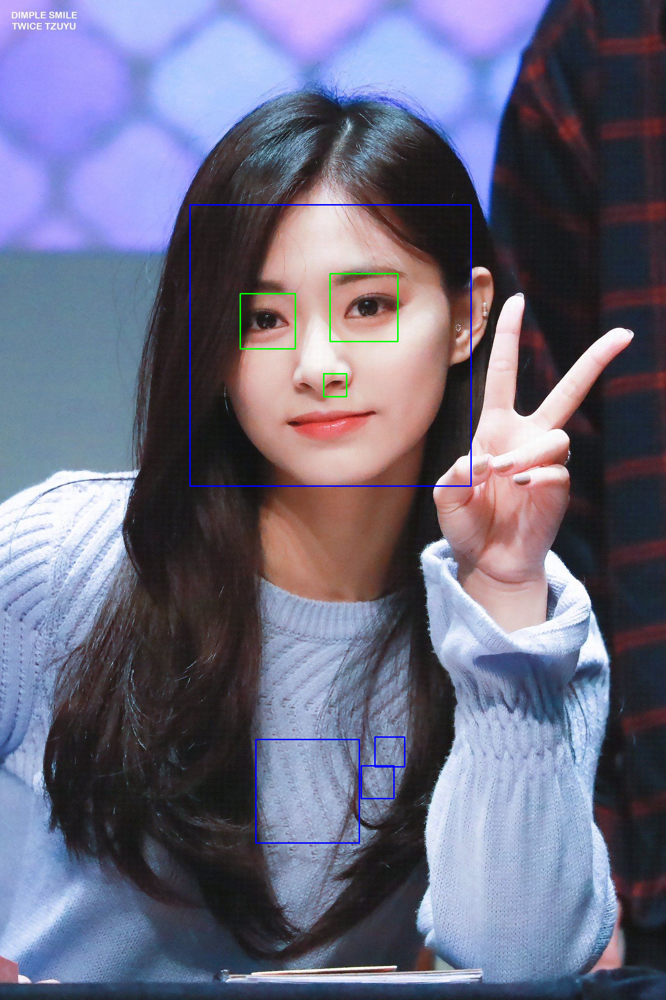

In [ ]:
# 눈까지 찾아봅시다. 
image_temp = image.copy()
for (x, y, w, h) in faces:
    cv2.rectangle(image_temp, (x, y), (x+w, y+h), (255, 0, 0), 2)    
    face_rect = image_temp[y:y+h, x:x+w]
    # 눈은 얼굴 안에서 찾습니다.
    eyes = eye_cascade.detectMultiScale(face_rect)    
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(face_rect, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)
cv2_imshow(image_temp)

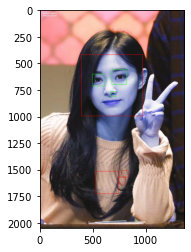

In [ ]:
plt.imshow(image_temp)

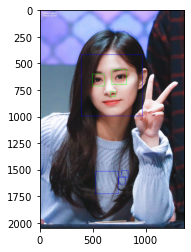

In [ ]:
image_temp = cv2.cvtColor(image_temp, cv2.COLOR_BGR2RGB )
plt.imshow(image_temp)

In [ ]:
image = cv2.imread('/g/My Drive/Tensorflow AI/twice3.png')
image2= image.copy()

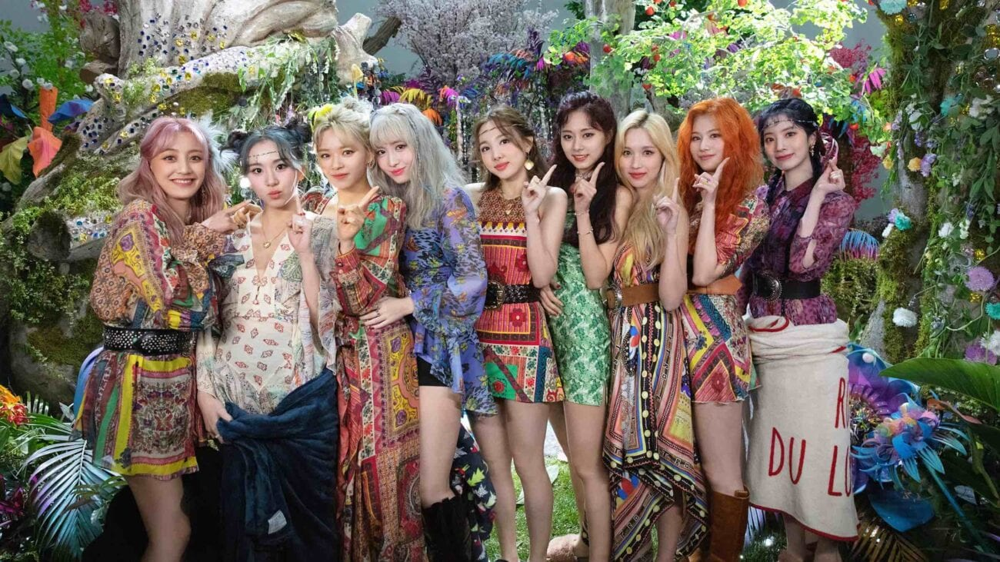

In [ ]:
cv2_imshow(image)

In [ ]:
faces = face_cascade.detectMultiScale(image)
print(faces)

[[720 153  64  64]
 [887 156  61  61]
 [981 151  71  71]
 [612 164  67  67]
 [470 162  79  79]
 [792 172  72  72]
 [400 169  79  79]
 [194 172  86  86]
 [428 256  51  51]
 [832 251  64  64]
 [947 256  59  59]
 [372 282  57  57]
 [308 187  86  86]
 [769 186 131 131]
 [468 316  53  53]
 [282 369 134 134]
 [101 449  55  55]
 [732 453  54  54]
 [725 476  71  71]
 [618 539  35  35]]


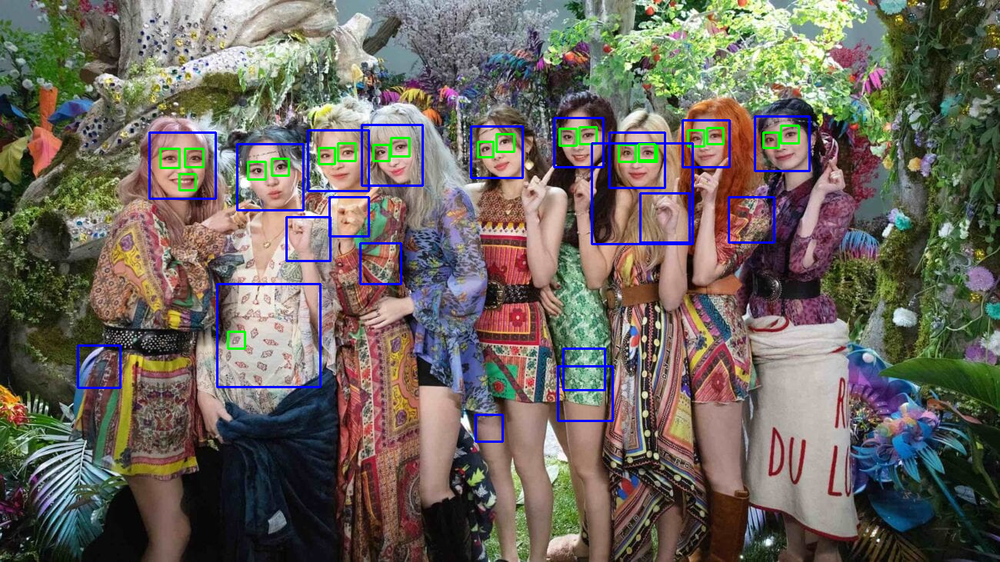

In [ ]:
for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x+w, y+h), (255, 0, 0), 2)    
    roi_color = image[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(roi_color)    
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)
cv2_imshow(image)

detectMultiScale 파라미터

https://docs.opencv.org/3.4/d1/de5/classcv_1_1CascadeClassifier.html#aaf8181cb63968136476ec4204ffca498

In [ ]:
faces = face_cascade.detectMultiScale(image2, minNeighbors = 10)

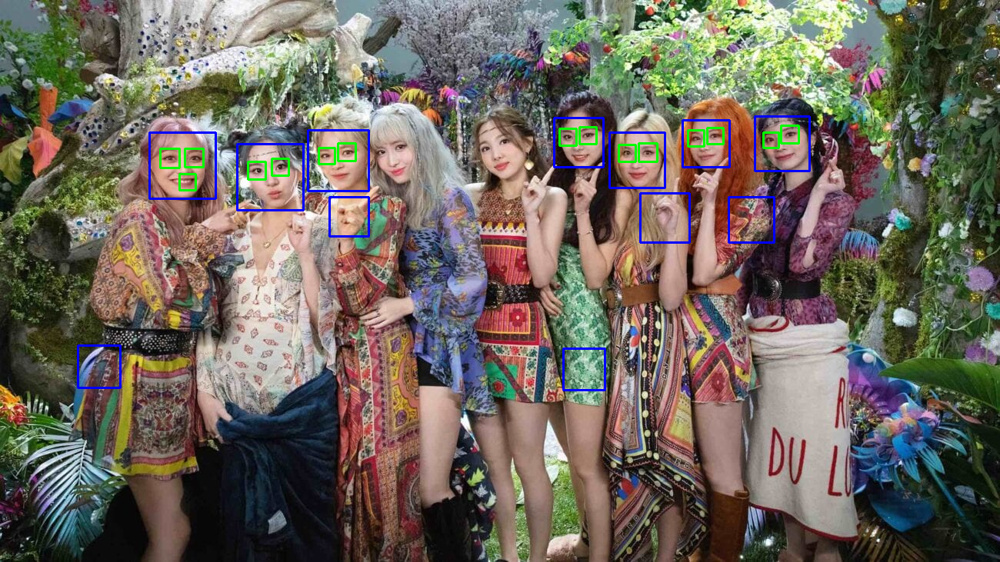

In [ ]:
for (x, y, w, h) in faces:
    cv2.rectangle(image2, (x, y), (x+w, y+h), (255, 0, 0), 2)    
    roi_color = image2[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(roi_color)    
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)


cv2_imshow(image2)